In [1]:
from flu_matrix_completion import *

# Load in data from papers on H3N2 strains and antigenic mapping
Primarily using `HI_data_tables` class to keep track of data in a SQL datatables kind of way.

In [16]:
# Load in antisera-virus data as pd.DataFrames
HI_df = pd.read_csv("data/fonville_hinojosa_data.csv", index_col='sampleID')
antisera_df = pd.read_csv("data/fonville_hinojosa_antisera_table.csv", index_col='sampleID')

## Add data to HI_data_tables object
flu_data_tables = HI_data_tables() # Create HI_data_tables object
flu_data_tables.add_HI_data(HI_df=HI_df,
                            antisera_df=antisera_df) # Add data from Tal's ad Rong's original paper
flu_data_tables.compute_virus_dates() # Call compute_virus_dates method to compute years of virus

In [17]:
# Add Ertesvag data using HI_data_tables class and associated methods
E3A_df = np.log10(pd.read_csv("data/Ertesvag_2022_Fig_S3A.csv").set_index("Unnamed: 0"))
E3A_antisera_table = pd.read_csv('data/Ertesvag_2022_Fig_S3A_antisera_table').set_index("sampleID")

E3B_df = np.log10(pd.read_csv("data/Ertesvag_2022_Fig_S3B.csv").set_index("Unnamed: 0"))
E3B_antisera_table = pd.read_csv('data/Ertesvag_2022_Fig_S3B_antisera_table').set_index("sampleID")

flu_data_tables.add_HI_data(HI_df=E3A_df,
                            antisera_df=E3A_antisera_table)
flu_data_tables.add_HI_data(HI_df=E3B_df,
                            antisera_df=E3B_antisera_table)

<Axes: ylabel='sampleID'>

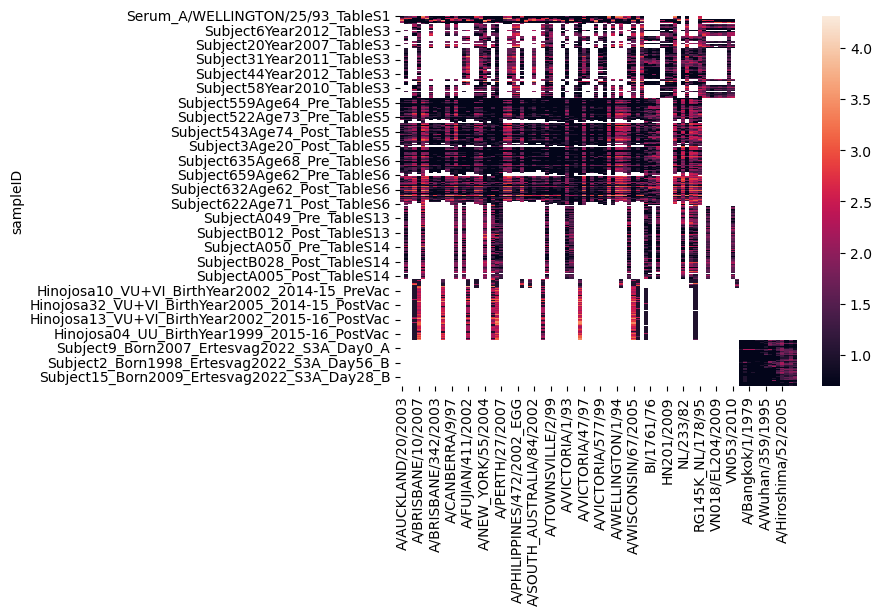

In [18]:
sns.heatmap(flu_data_tables.HI_data)

### How to use `HI_data_tables.select_HI_data_by_group` method

Text(0.5, 0.98, 'HI Heatmap for fonville ferrets and H3N2 Strains')

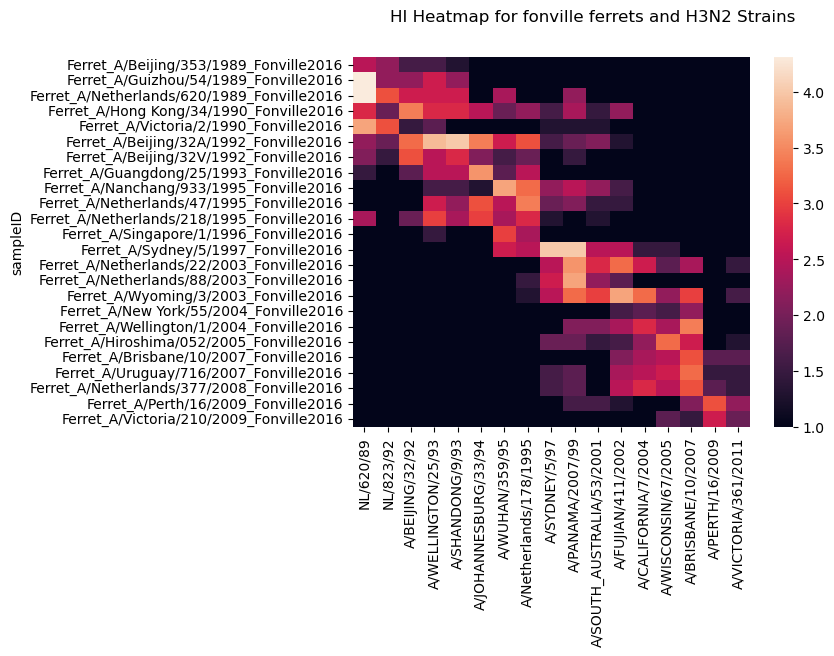

In [20]:
sns.heatmap(flu_data_tables.select_HI_data_by_group(group=['fon_ferrets']).dropna(axis=1))
plt.suptitle('HI Heatmap for fonville ferrets and H3N2 Strains')

Text(0.5, 0.98, 'HI Heatmap for fonville children and H3N2 Strains')

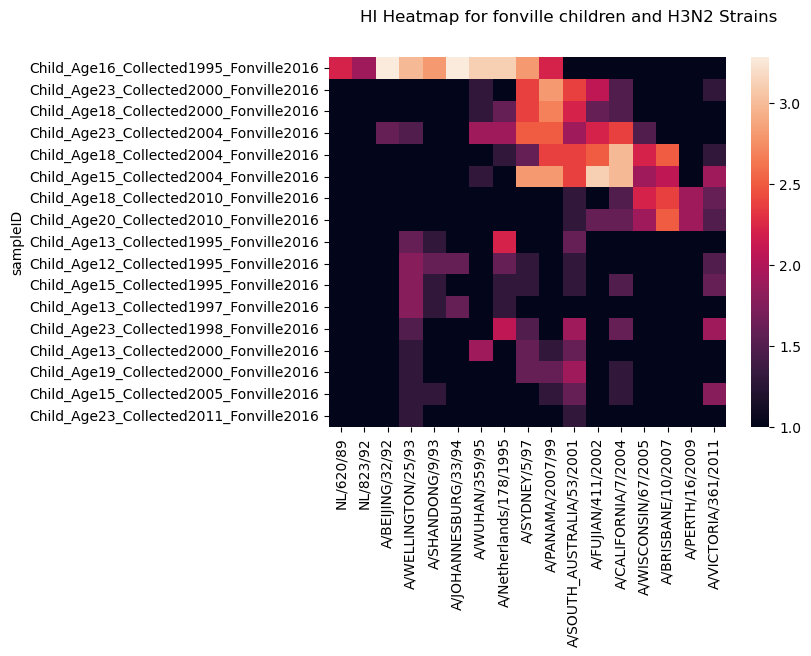

In [22]:
sns.heatmap(flu_data_tables.select_HI_data_by_group(group=['fon_children']).dropna(axis=1))
plt.suptitle('HI Heatmap for fonville children and H3N2 Strains')

# Perform table-wise comparisons for each data group

In [5]:
# comparisons_obj = transferability_comparisons(HI_data_tables=flu_data_tables)
# comparisons_obj.train_comparison_trees(train_trees=1, best_trees=1)
# comparisons_obj.plot_comparisons(save_to='figs/fonville_hinojosa_ertesvag_train1best1_comparison_plot.png', alpha=0.4)

In [14]:
# other_comparisons_obj.save_data("models/fonville_hinojosa_ertesvag_train1best1_comparison_data.pkl")

In [23]:
other_comparisons_obj = transferability_comparisons(HI_data_tables=flu_data_tables)
other_comparisons_obj.load_data("models/fonville_hinojosa_ertesvag_train1best1_comparison_data.pkl")

# Compute ODRs for each table-wise comparison of models

In [8]:
other_comparisons_obj.compute_comparison_virus_ODR_df_dict()

In [28]:
other_comparisons_obj.plot_comparisons_with_ODRs(save_to='figs/fonville_hinojosa_ertesvag_train1best1_comparison_plot_w_ODRs.png', alpha=0.4)

# See how combining trees trained on different datasets can impact performance

### Compute `comparison_combiner_dict`

In [9]:
other_comparisons_obj.compute_comparison_combiner_dict()

### Visualize how model trained on TableS13 performs for predicting HI for TableS14 viruses

error: 2.282766172839833


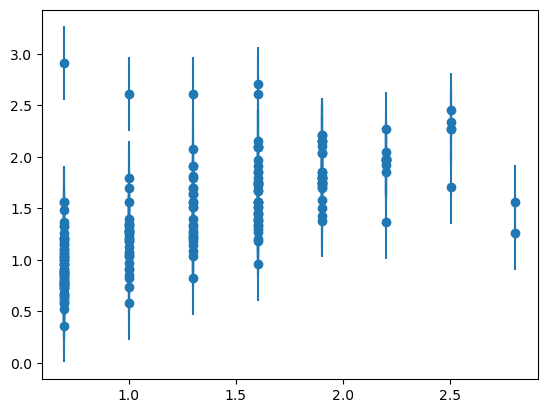

In [26]:
preds, errs = combine_predictions(target_virus_name='A/AUCKLAND/5/96',
                                  target_table_name='TableS14',
                                  source_table_names=['TableS13'],
                                  comparison_combiner_dict=other_comparisons_obj.comparison_combiner_dict)
HAI_measurements, _, _ = other_comparisons_obj.comparison_combiner_dict['TableS13 TO TableS14']['A/AUCKLAND/5/96']['error_bar_data']
y = np.log10(preds)
yerr = [errs]*len(HAI_measurements)
plt.errorbar(HAI_measurements,y, yerr=yerr, fmt='o')

print("error:", 10**errs) 

### Visualize how combining models trained on 'TableS13', 'TableS1', and 'TableS3'  affects performance when predicting HI for TableS14 viruses
Error goes down quite a bit!

error: 1.424217139787305


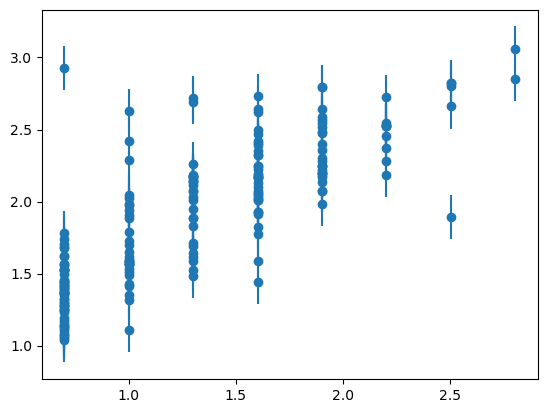

In [27]:
preds, errs = combine_predictions(target_virus_name='A/AUCKLAND/5/96',
                                  target_table_name='TableS14',
                                  source_table_names=['TableS13', 'TableS1', 'TableS3'],
                                  comparison_combiner_dict=other_comparisons_obj.comparison_combiner_dict)
HAI_measurements, _, _ = other_comparisons_obj.comparison_combiner_dict['TableS13 TO TableS14']['A/AUCKLAND/5/96']['error_bar_data']
y = np.log10(preds)
yerr = [errs]*len(HAI_measurements)
plt.errorbar(HAI_measurements,y, yerr=yerr, fmt='o')

print("error:", 10**errs) # hmmm, adding datasets did seem to improve error!. Funny

In [10]:
# comparisons_obj.compute_comparison_virus_ODR_df_dict()

In [11]:
# other_comparisons_obj.plot_comparisons_with_ODRs(save_to='figs/fonville_hinojosa_ertesvag_train1best1_comparison_plot_w_ODRs.png', alpha=0.4)

In [12]:
# import pickle
# # Save the object to a file using pickle
# with open('models/fonville_hinojosa_ertesvag_train100best20_comparison_plot.pkl', 'wb') as file:
#     pickle.dump(comparisons_obj, file)

# print("Object saved successfully.")

# # Load the object from the file
# with open('models/fonville_hinojosa_ertesvag_train100best20_comparison_plot.pkl', 'rb') as file:
#     loaded_object = pickle.load(file)
# # Now, 'loaded_object' is a new instance with the same attributes as the original object
# print("Object loaded successfully.")
